#1) Install Dependencies 
(Remember to choose GPU in Runtime if not already selected. Runtime --> Change Runtime Type --> Hardware accelerator --> GPU)

In [1]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  
%cd yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 14936, done.
remote: Counting objects: 100% (28/28), done.
remote: Compressing objects: 100% (24/24), done.
remote: Total 14936 (delta 12), reused 16 (delta 4), pack-reused 14908
Receiving objects: 100% (14936/14936), 14.01 MiB | 30.21 MiB/s, done.
Resolving deltas: 100% (10259/10259), done.
/content/yolov5


In [2]:
# install dependencies as necessary
!pip install -qr requirements.txt 
import torch

from IPython.display import Image, clear_output  # to display images
from utils.downloads import attempt_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.0/184.0 KB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 KB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 33.3 MB/s eta 0:00:00
Setup complete. Using torch 1.13.0+cu116 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


#2) Download Correctly our Formatted  Dataset

In [3]:
%cd /content/yolov5
!pip install roboflow

from roboflow import Roboflow
#Get API Key for our hard_hat_workers dataset and store it into yolov5 repository 
rf = Roboflow(api_key="odzpE9c2Ek4qUhWf4GNg")
project = rf.workspace("joseph-nelson").project("hard-hat-workers")
dataset = project.version(10).download("yolov5")

/content/yolov5
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 KB 3.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 KB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.5/138.5 KB 17.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 KB 7.0 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9674 sha256=3fb021dbce9cca57be397ff90625c323cb2f5e20f580ef255a1dfc3a0990ba9f
  Stored in directory: /root/.cache/pip/wheels/bd/a8/c3/3cf2c14a1837a4e04bd98631724e81f33f462d86a1d895fae0
Successfully built wget
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully uninstalled urllib3-1.24.3
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.0.9
    Uni

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Hard-Hat-Workers-10 in yolov5pytorch:: 100%|██████████| 14082/14082 [00:03<00:00, 3823.12it/s]


In [4]:
# this is the YAML file Robotflow wrote for us that we're loading into this notebook with our data
%cat {dataset.location}/data.yaml

names:
- head
- helmet
- person
nc: 3
train: Hard-Hat-Workers-10/train/images
val: Hard-Hat-Workers-10/valid/images


# 3) Define Model Configuration and Architecture
We will write a yaml script that defines the parameters for our model like the number of classes, anchors, and each layer.

In [5]:
# define number of classes based on YAML
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [6]:
# we created this  "custom_yolov5s.yaml" YAML file for our yolov5 model configuration 
%cat /content/yolov5/models/custom_yolov5s.yaml


# parameters
nc: 3  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-

# 4) Train Custom YOLOv5 Detector

In [8]:
# train yolov5s on our Hard_hat_Workers  dataset  for 30 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 640 --batch 32 --epochs 30 --data {dataset.location}/data.yaml --cfg ./models/custom_yolov5s.yaml --weights yolov5s.pt --name yolov5s_results

/content/yolov5
train: weights=yolov5s.pt, cfg=./models/custom_yolov5s.yaml, data=/content/yolov5/Hard-Hat-Workers-10/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=30, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-59-gfdc35b1 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.

# 5) Evaluate YOLOv5 Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the --name flag when we train. In our case, we named this yolov5s_results. 

In [9]:
# Start tensorboard
# Launch after starting  training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs 

<IPython.core.display.Javascript object>

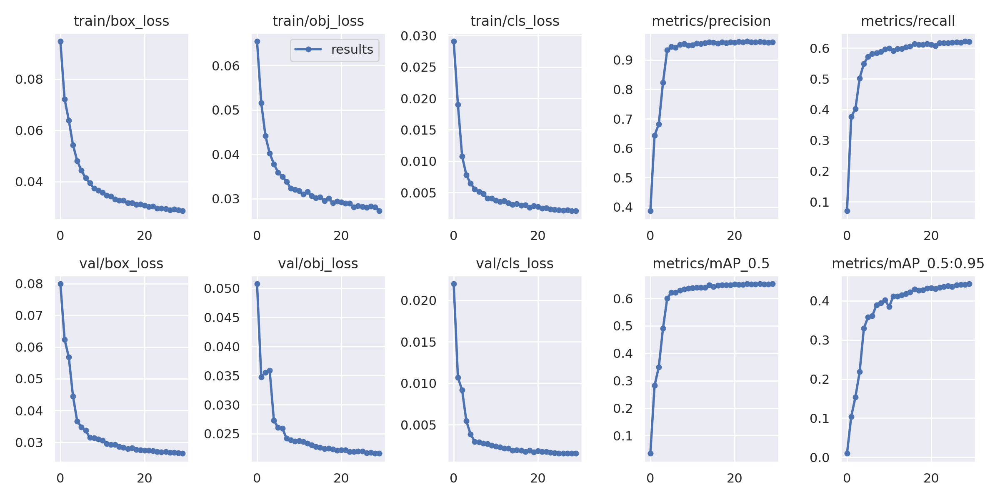

In [10]:
# display some older school graphs  
from utils.plots import plot_results  # plot yolov5s_results as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # view results.png

# 6) Visualize Our Training Data with Labels

GROUND TRUTH TRAINING DATA:


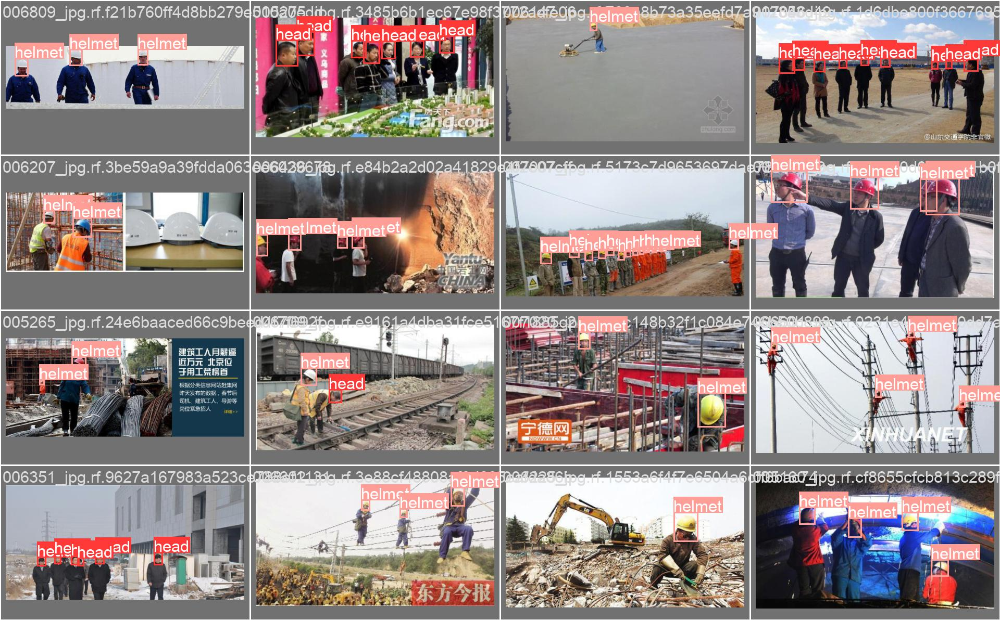

In [11]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


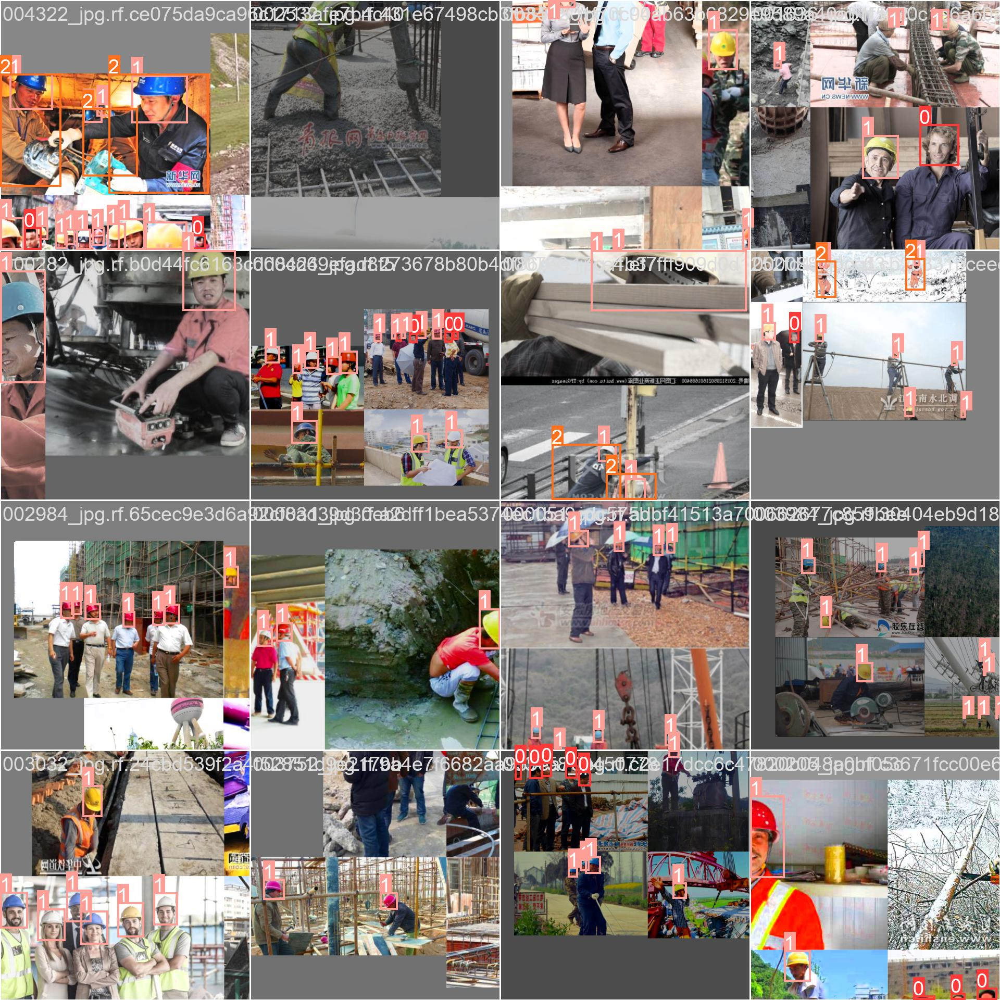

In [12]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch0.jpg', width=900)

# 7) Run Inference With Trained Weights

In [13]:
# trained weights are saved by default in our weights folder
%ls runs/

train/


In [14]:
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [15]:
# Helmet and Head detection 
# use the best weights! (best.pt)
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --data {dataset.location}/data.yaml --img 640 --conf 0.4 --source /content/yolov5/Hard-Hat-Workers-10/test/images

/content/yolov5
detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=/content/yolov5/Hard-Hat-Workers-10/test/images, data=/content/yolov5/Hard-Hat-Workers-10/data.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-59-gfdc35b1 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7251912 parameters, 0 gradients
image 1/706 /content/yolov5/Hard-Hat-Workers-10/test/images/005298_jpg.rf.a45f45b9d3abc292b3d0e53ff944adfc.jpg: 448x640 9 helmets, 17.9ms
image 2/706 /content/yolov5/Hard-Hat-Workers-10/test/images/005299_jpg.rf.8f9fff2eb7a015a006adde59fab8a087.jpg: 448x640 1 helmet, 

The detected images are stored finally in : 'runs/detect/exp'

In [17]:
# Helmet tracking using videos downloaded from internet : if we detect helmet ==> person is safe elif we detect head ==> unsafety 
# create "videos" folder in our test dataset and put into it videos to test helmet tracking ""
# use the best weights! (best.pt) 
%cd /content/yolov5/
!python detect.py --weights /content/yolov5/runs/train/yolov5s_results/weights/best.pt  --source /content/yolov5/Hard-Hat-Workers-10/test/videos 

/content/yolov5
detect: weights=['/content/yolov5/runs/train/yolov5s_results/weights/best.pt'], source=/content/yolov5/Hard-Hat-Workers-10/test/videos, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-59-gfdc35b1 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7251912 parameters, 0 gradients
video 1/1 (1/900) /content/yolov5/Hard-Hat-Workers-10/test/videos/persons_work.mp4: 384x640 (no detections), 13.6ms
video 1/1 (2/900) /content/yolov5/Hard-Hat-Workers-10/test/videos/persons_work.mp4: 384x640 (no detections), 9.5ms
video 1/1 (3/900) /content/yolov5/Hard-Hat-Worke

The detected videos are stored finally in 'runs/detect/exp3' 

# 8) Export Trained Weights for Future Inference

In [22]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
